## Google Colab Setup


In [ ]:
from google.colab import drive
drive.mount("/content/drive")

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
import os
datadir = "/content/drive/MyDrive/hw3/part2" # path to the homework
if not os.path.exists(datadir):
  !ln -s "" $datadir # path to the homework
os.chdir(datadir)
!pwd

/content/drive/MyDrive/hw3/part2


In [ ]:
import torch
from torch.autograd import Variable
import torchvision
import torchvision.transforms as Trans
import random
import numpy as np
from scipy.ndimage.filters import gaussian_filter1d
import matplotlib.pyplot as plt
from PIL import Image

%matplotlib inline
plt.rcParams['figure.figsize'] = (10.0, 8.0) # set default size of figures
plt.rcParams['image.interpolation'] = 'nearest'
plt.rcParams['image.cmap'] = 'gray'

<ipython-input-62-b83c14d18fc8>:7: DeprecationWarning: Please use `gaussian_filter1d` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  from scipy.ndimage.filters import gaussian_filter1d


In [ ]:
def preprocess(img, size=224):
    transform = Trans.Compose([
        Trans.Resize(size),
        Trans.ToTensor(),
        Trans.Normalize(mean=[0.485, 0.456, 0.406],
                    std=[0.229, 0.224, 0.225]),
    ])
    return transform(img)

def deprocess(img, should_rescale=True):
    transform = Trans.Compose([
        Trans.Normalize(mean=[0, 0, 0], std=[1.0/0.229, 1.0/0.224, 1.0/0.225]),
        Trans.Normalize(mean=[-0.485, -0.456, -0.406], std=[1, 1, 1]),
        Trans.ToPILImage(),
    ])
    return transform(img)

## Loading ResNet18


In [ ]:
# Download and load the pretrained ResNet18 model.
from torchvision.models import resnet18
resnet18 = resnet18(pretrained=True)
resnet18.eval()

# We're not going to be training the model, so disable gradient computation for the parameters.
for param in resnet18.parameters():
    param.requires_grad = False

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


## Load provided sample ImageNet images


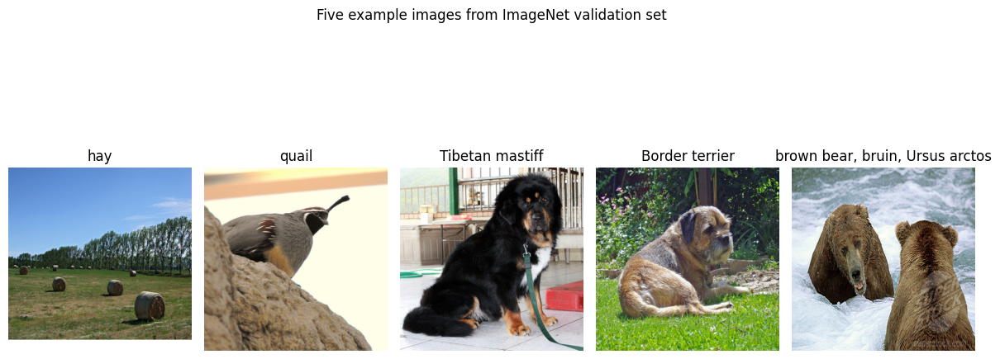

In [ ]:
def load_data(num=None):
    data_path = './imagenet_data.npz'
    f = np.load(data_path, allow_pickle=True)
    X = f['X']
    y = f['y']
    class_names = f['label_map'].item()
    if num is not None:
        X = X[:num]
        y = y[:num]
    return X, y, class_names


X, y, class_names = load_data(num=5)  # X is a numpy array of size [5, 224, 224, 3] (5 images)
# y is a list of the class indices (there are 1000 indices, each corresponding to a different class)
# the class names variable shows the list that maps each index to the class name. Feel free to print this out.

plt.figure(figsize=(12, 6))
for i in range(5):
    plt.subplot(1, 5, i + 1)
    plt.imshow(X[i])
    plt.title(class_names[y[i]])
    plt.axis('off')
plt.suptitle('Five example images from ImageNet validation set')
plt.gcf().tight_layout()

## Explaining model predictions

First, we will be looking at how each pixel in the input image affects the prediction. The idea is that if we compute the gradient with respect to each pixel, we'll be able to understand how much the output changes if that pixel changes.

We'll use a very simple strategy for this. To compute the attention map, you'll first compute the gradient with respect to the input image. Remember, there are three input channels, so your gradient will be the same size as the input image. We aren't going to consider the differences between positive vs negative gradients here, so you'll take the absolute value of the gradient, and then take the max gradient value across the red, green, and blue channels. When finished, you'll get an attention map the same size of the input that essentially tells us how important that pixel is for the prediction. Note that this is the technique explained in section 3.1 of [this paper](https://arxiv.org/pdf/1312.6034.pdf), if you are curious. The same idea can be applied to language models like transformers as well, by computing attention scores for each token (which roughly corresponds to words).


In [ ]:
def compute_attention_maps(X, y, model):
    """
    Compute the attention map for each image X and label y
    Return an attention map of shape (N, H, W), where N is number of images
    """
    model.eval()

    # Convert X and y into torch Variables and ensure they're of the correct type
    X_var = Variable(torch.FloatTensor(X), requires_grad=True)
    y_var = torch.LongTensor(y)

    # Forward pass
    outputs = model(X_var)

    # Select the outputs corresponding to the correct labels
    # We use gather to index the output using the labels
    outputs = outputs.gather(1, y_var.view(-1, 1)).squeeze()

    # Backward pass
    # We compute the gradient of outputs with respect to the input images
    outputs.backward(torch.ones_like(outputs))

    # Compute the absolute values of the gradients
    gradients = torch.abs(X_var.grad.data)

    # Take the max across the color channels
    attention_maps = torch.max(gradients, dim=1)[0]

    return attention_maps.cpu().numpy()

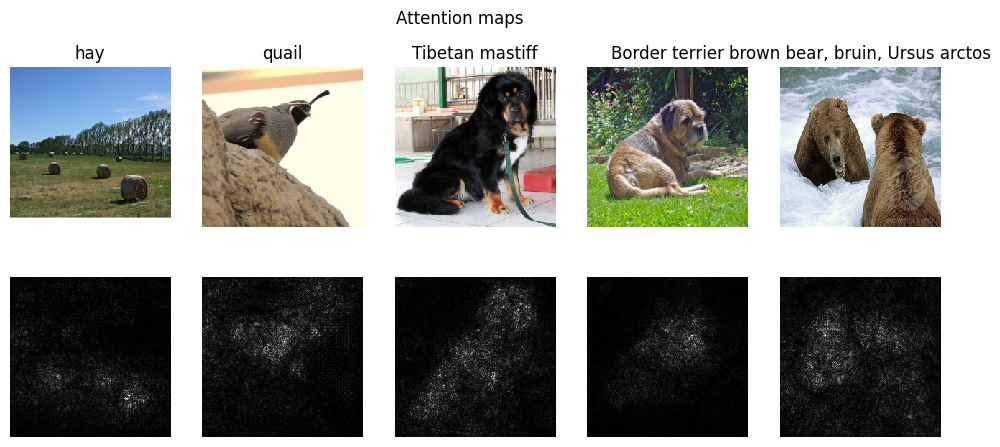

In [ ]:
def show_attention_maps(X, y):
    preprocessed_tensors = [preprocess(Image.fromarray(x)).unsqueeze(0) for x in X]
    X_tensor = torch.cat(preprocessed_tensors, dim=0)
    y_tensor = torch.LongTensor(y)
    attention = compute_attention_maps(X_tensor, y_tensor, resnet18)

    N = X.shape[0]
    for i in range(N):
        plt.subplot(2, N, i + 1)
        plt.imshow(X[i])
        plt.axis('off')
        plt.title(class_names[y[i]])
        plt.subplot(2, N, N + i + 1)
        plt.imshow(attention[i], cmap=plt.cm.gray)
        plt.axis('off')
        plt.gcf().set_size_inches(12, 5)
    plt.suptitle('Attention maps')
    plt.show()

show_attention_maps(X, y)

## Adversarial examples

**fast gradient sign method** and the **iterative gradient sign method**.

- Kurakin, Alexey, Ian J. Goodfellow, and Samy Bengio. [Adversarial examples in the physical world.](https://arxiv.org/pdf/1607.02533.pdf) You'll be implementing the fast method and the basic iterative method described in section 2.1 and 2.2 in this paper.
- Goodfellow, Ian J., Jonathon Shlens, and Christian Szegedy. [Explaining and harnessing adversarial examples.](https://arxiv.org/pdf/1412.6572.pdf) (this is the paper where the fast method came from)


In [ ]:
def fast_gradient_sign_method(X, y_true, model, eps):
    model.eval()
    X.requires_grad = True

    # Forward pass
    outputs = model(X)
    loss = torch.nn.functional.cross_entropy(outputs, y_true)

    # Backward pass
    model.zero_grad()
    loss.backward()

    # Scale eps to normalized range and apply attack
    eps_scaled = eps / 255.0
    X_prime = X + eps_scaled * X.grad.sign()

    # Convert min_val and max_val to tensors and clamp to normalized range [min_val, max_val]
    min_val = torch.tensor((0 - np.array([0.485, 0.456, 0.406])) / np.array([0.229, 0.224, 0.225]), dtype=torch.float32, device=X.device).view(1, 3, 1, 1)
    max_val = torch.tensor((1 - np.array([0.485, 0.456, 0.406])) / np.array([0.229, 0.224, 0.225]), dtype=torch.float32, device=X.device).view(1, 3, 1, 1)
    X_prime = torch.clamp(X_prime, min_val, max_val)

    return X_prime

In [ ]:
def iterative_method(X, y_true, model, eps, alpha=None, num_iter=None):
    if alpha is None:
        alpha = eps / 1000  # Use a much smaller alpha
    if num_iter is None:
        num_iter = int(min(eps + 4, 1.25 * eps))

    model.eval()
    X_prime = X.clone()
    X_prime.requires_grad = True

    for _ in range(num_iter):
        outputs = model(X_prime)
        loss = torch.nn.functional.cross_entropy(outputs, y_true)

        model.zero_grad()
        loss.backward()

        # Use smaller step size alpha
        X_prime = X_prime + alpha * X_prime.grad.sign()

        # Clamp the perturbations to be within the normalized bounds
        eta = torch.clamp(X_prime - X, min=-eps/255.0, max=eps/255.0)
        min_val = torch.tensor((0 - np.array([0.485, 0.456, 0.406])) / np.array([0.229, 0.224, 0.225]), dtype=torch.float32, device=X.device).view(1, 3, 1, 1)
        max_val = torch.tensor((1 - np.array([0.485, 0.456, 0.406])) / np.array([0.229, 0.224, 0.225]), dtype=torch.float32, device=X.device).view(1, 3, 1, 1)
        X_prime = torch.clamp(X + eta, min_val, max_val).detach_()
        X_prime.requires_grad = True

    return X_prime

In [ ]:
def run_analysis():
    epsilons = [2, 4, 8, 16]  # Define epsilon values to test
    resnet18.eval()  # Set model to evaluation mode

    for idx in range(len(X)):  # Iterate over each image
        img = Image.fromarray(X[idx])
        img_tensor = preprocess(img).unsqueeze(0)  # Add batch dimension

        # Convert label into tensor
        label_tensor = torch.tensor([y[idx]], dtype=torch.long)

        # Forward pass to get model prediction before any adversarial attack
        output = resnet18(img_tensor)
        probability_before = torch.nn.functional.softmax(output, dim=1)[0, y[idx]].item()

        print(f'Original class: {class_names[y[idx]]}, Probability of correct class before any attack: {probability_before:.4f}')

        for eps in epsilons:
            # Scale eps for normalized data
            eps_scaled = eps / 255.0
            for method in [fast_gradient_sign_method, iterative_method]:
                method_name = "FGSM" if method == fast_gradient_sign_method else "Iterative"
                print(f"\nApplying {method_name} with eps = {eps}")

                # Generate adversarial image using the current method and epsilon
                adversarial_img_tensor = method(img_tensor.clone(), label_tensor, resnet18, eps)
                output_adv = resnet18(adversarial_img_tensor)
                probability_after = torch.nn.functional.softmax(output_adv, dim=1)[0, y[idx]].item()

                print(f'Probability of correct class {class_names[y[idx]]} after: {probability_after:.4f}')

                # Deprocess for visualization
                adversarial_image = np.asarray(deprocess(adversarial_img_tensor.squeeze(0))).astype(np.uint8)
                diff_image = np.asarray(deprocess(adversarial_img_tensor.squeeze(0) - img_tensor.squeeze(0)))
                magnified_diff_image = np.asarray(deprocess(10 * (adversarial_img_tensor.squeeze(0) - img_tensor.squeeze(0))))

                # Visualization
                plt.figure(figsize=(12, 5))
                plt.subplot(1, 4, 1)
                plt.imshow(X[idx])
                plt.title(f"Original: {class_names[y[idx]]}")
                plt.axis('off')

                plt.subplot(1, 4, 2)
                plt.imshow(adversarial_image)
                plt.title(f"Adversarial")
                plt.axis('off')

                plt.subplot(1, 4, 3)
                plt.imshow(diff_image)
                plt.title('Difference')
                plt.axis('off')

                plt.subplot(1, 4, 4)
                plt.imshow(magnified_diff_image)
                plt.title('Magnified Diff (10x)')
                plt.axis('off')

                plt.suptitle(f"{method_name} (eps={eps})")
                plt.show()

Original class: hay, Probability of correct class before any attack: 0.9999

Applying FGSM with eps = 2
Probability of correct class hay after: 0.9713


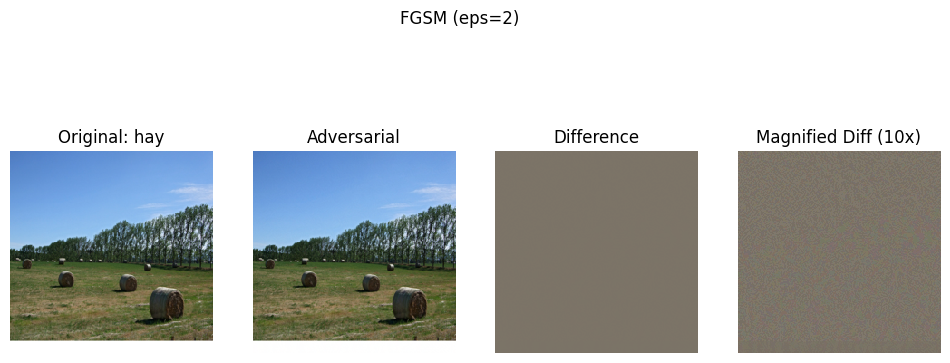


Applying Iterative with eps = 2
Probability of correct class hay after: 0.9956


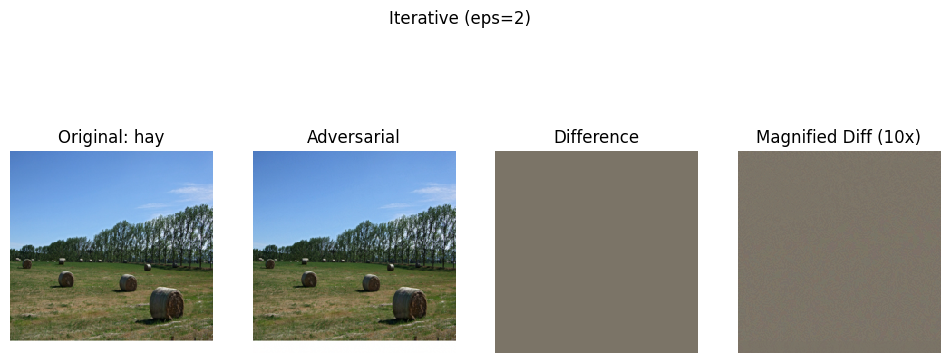


Applying FGSM with eps = 4
Probability of correct class hay after: 0.6917


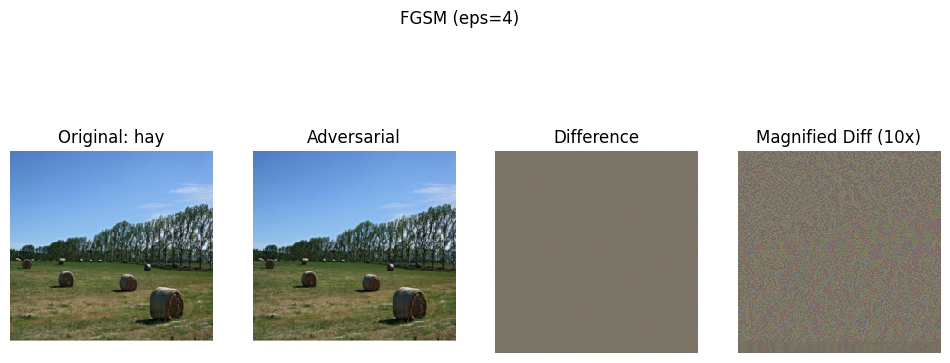


Applying Iterative with eps = 4
Probability of correct class hay after: 0.0050


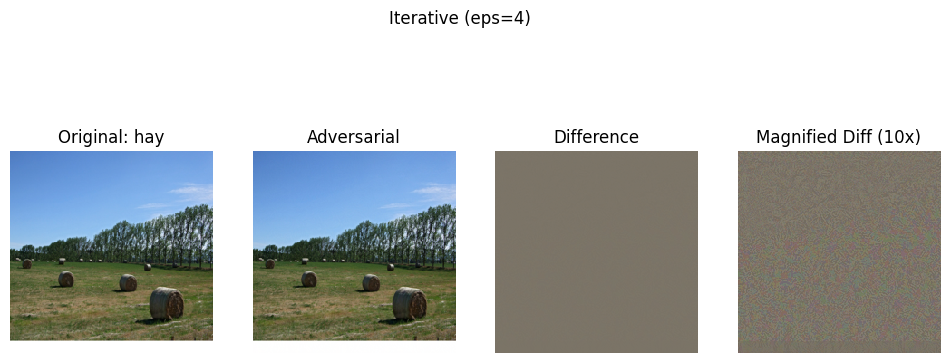


Applying FGSM with eps = 8
Probability of correct class hay after: 0.1943


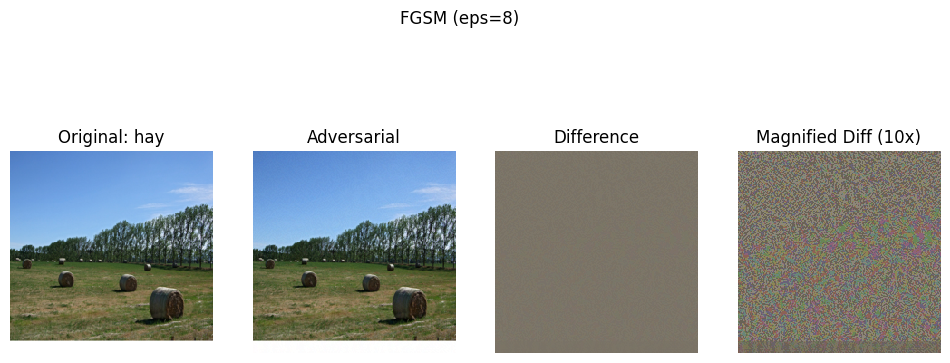


Applying Iterative with eps = 8
Probability of correct class hay after: 0.0000


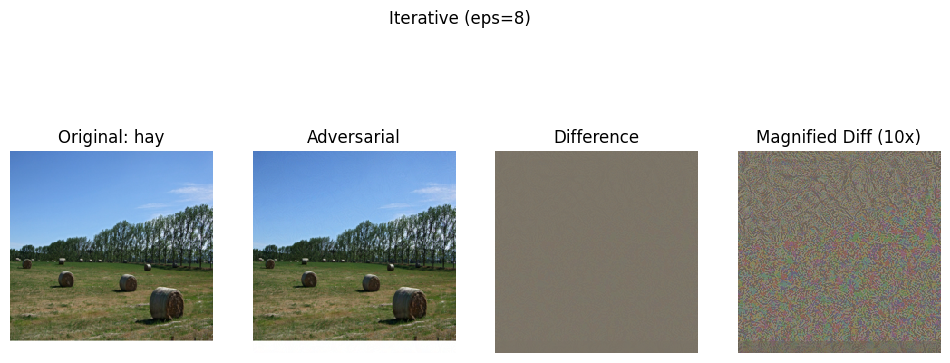


Applying FGSM with eps = 16
Probability of correct class hay after: 0.0791


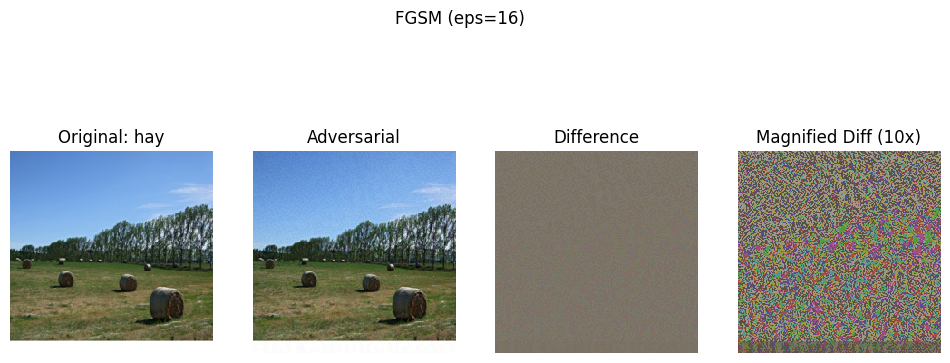


Applying Iterative with eps = 16
Probability of correct class hay after: 0.0000


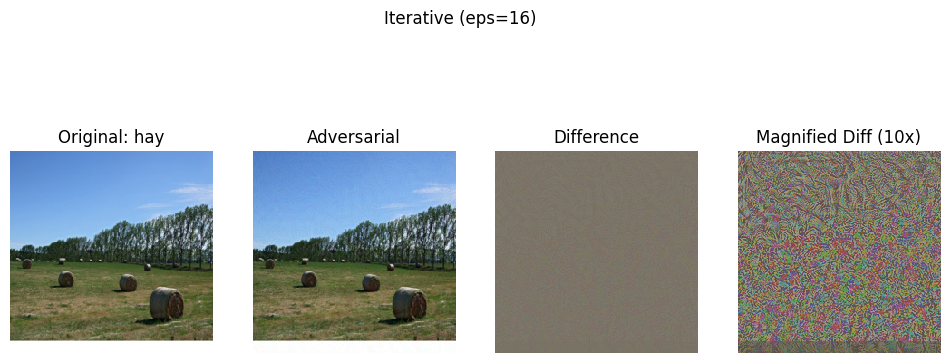

Original class: quail, Probability of correct class before any attack: 0.5927

Applying FGSM with eps = 2
Probability of correct class quail after: 0.0029


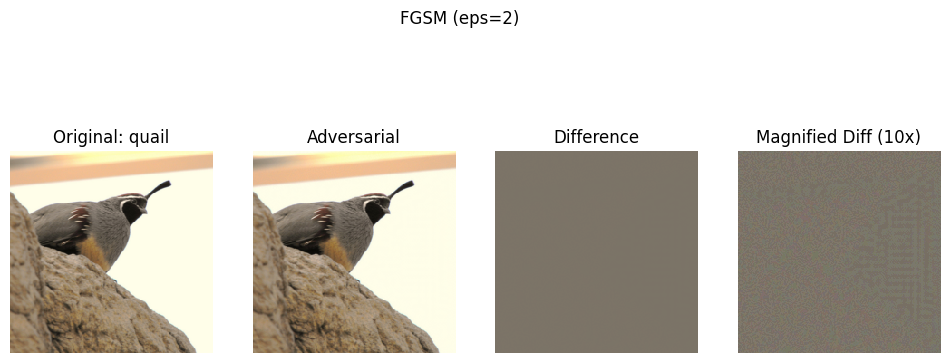


Applying Iterative with eps = 2
Probability of correct class quail after: 0.0184


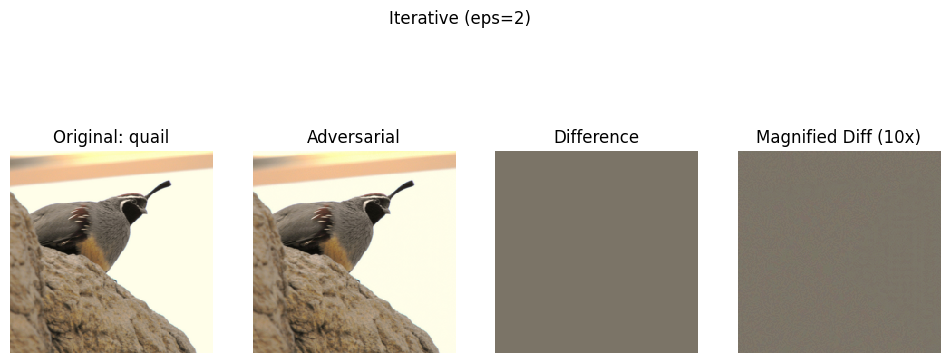


Applying FGSM with eps = 4
Probability of correct class quail after: 0.0001


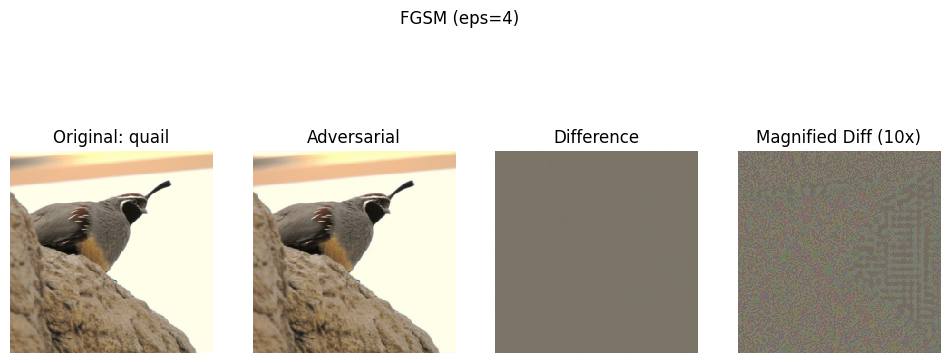


Applying Iterative with eps = 4
Probability of correct class quail after: 0.0000


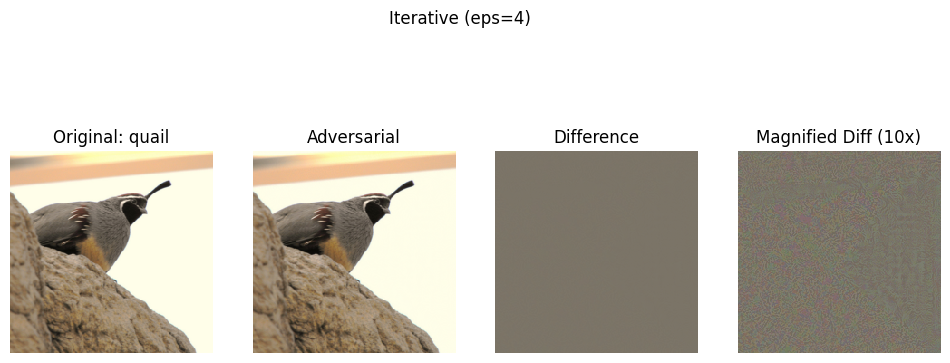


Applying FGSM with eps = 8
Probability of correct class quail after: 0.0000


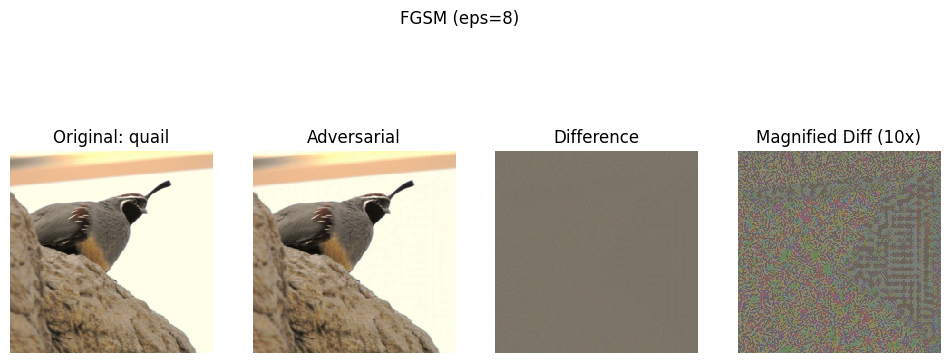


Applying Iterative with eps = 8
Probability of correct class quail after: 0.0000


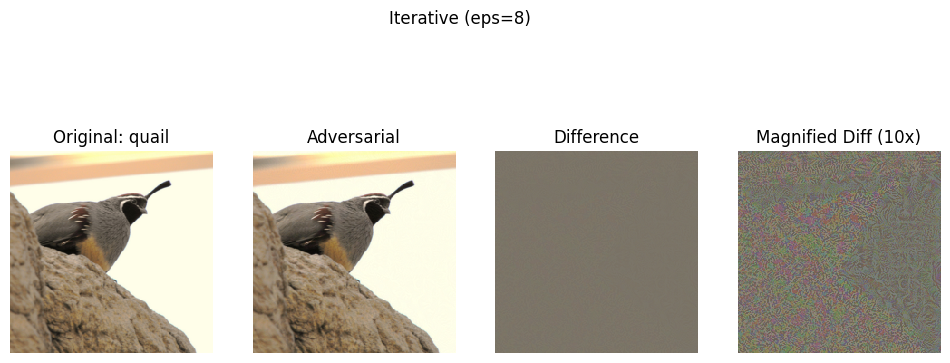


Applying FGSM with eps = 16
Probability of correct class quail after: 0.0000


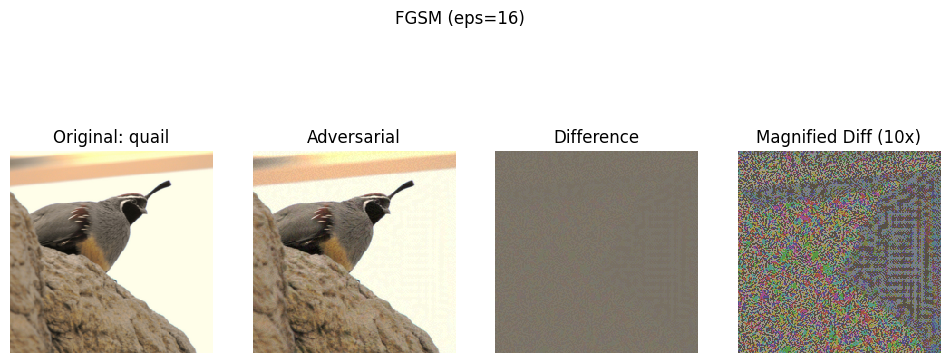


Applying Iterative with eps = 16
Probability of correct class quail after: 0.0000


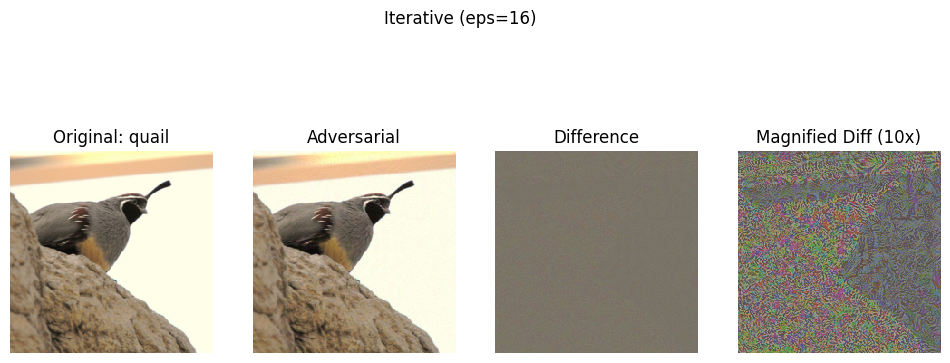

Original class: Tibetan mastiff, Probability of correct class before any attack: 0.9066

Applying FGSM with eps = 2
Probability of correct class Tibetan mastiff after: 0.0078


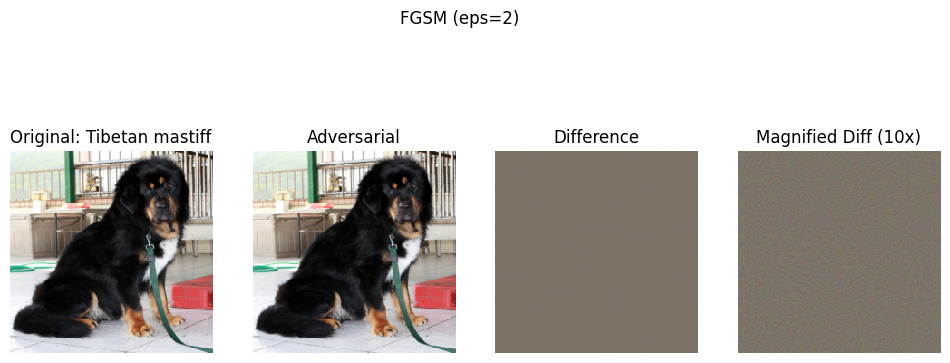


Applying Iterative with eps = 2
Probability of correct class Tibetan mastiff after: 0.0801


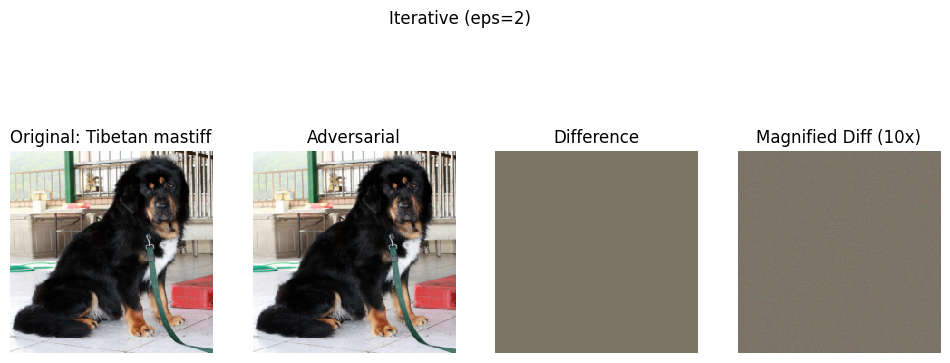


Applying FGSM with eps = 4
Probability of correct class Tibetan mastiff after: 0.0004


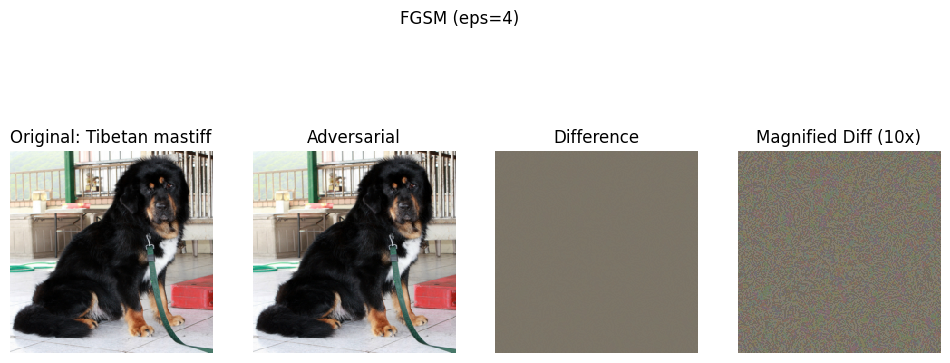


Applying Iterative with eps = 4
Probability of correct class Tibetan mastiff after: 0.0000


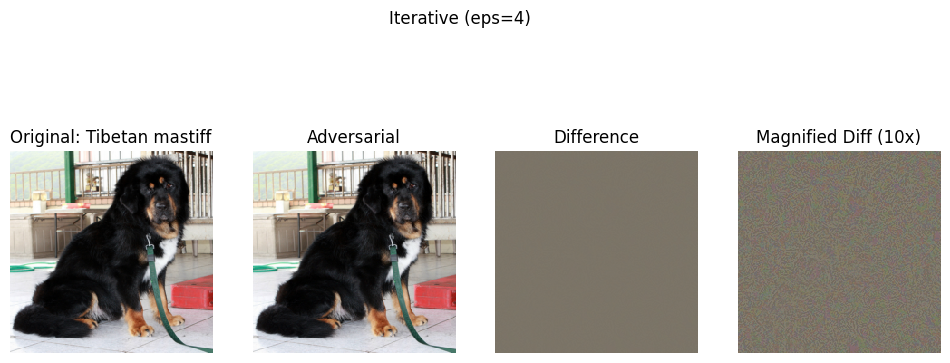


Applying FGSM with eps = 8
Probability of correct class Tibetan mastiff after: 0.0000


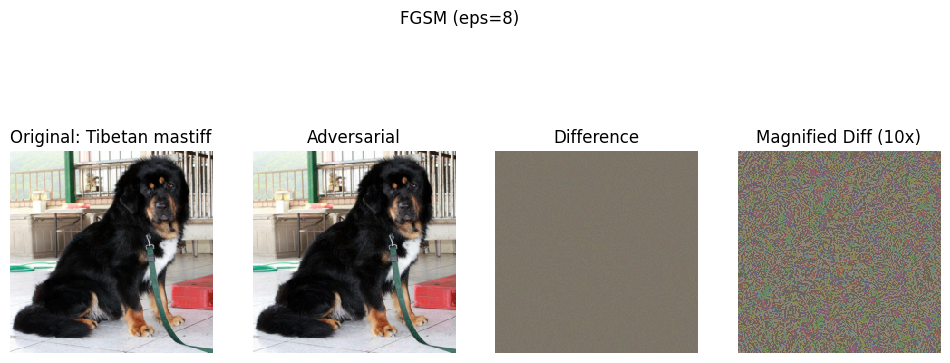


Applying Iterative with eps = 8
Probability of correct class Tibetan mastiff after: 0.0000


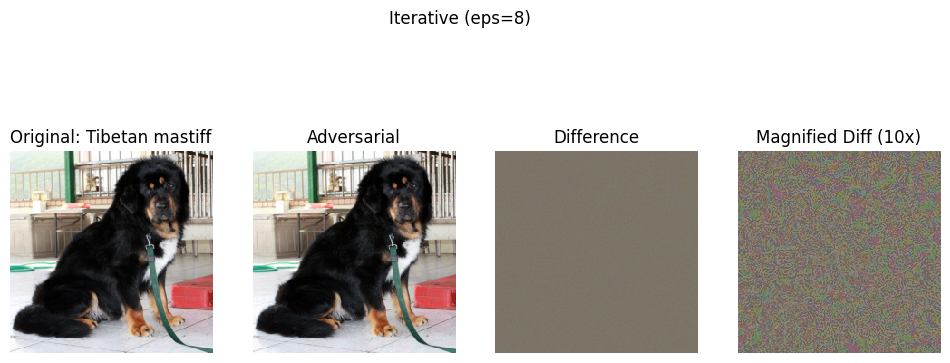


Applying FGSM with eps = 16
Probability of correct class Tibetan mastiff after: 0.0000


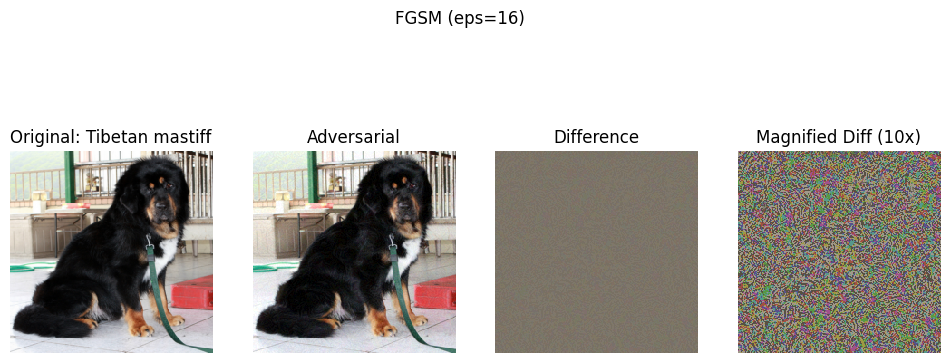


Applying Iterative with eps = 16
Probability of correct class Tibetan mastiff after: 0.0000


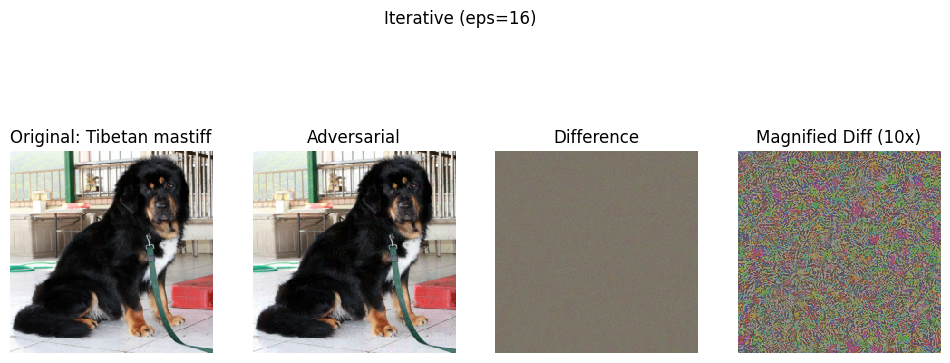

Original class: Border terrier, Probability of correct class before any attack: 0.8986

Applying FGSM with eps = 2
Probability of correct class Border terrier after: 0.0016


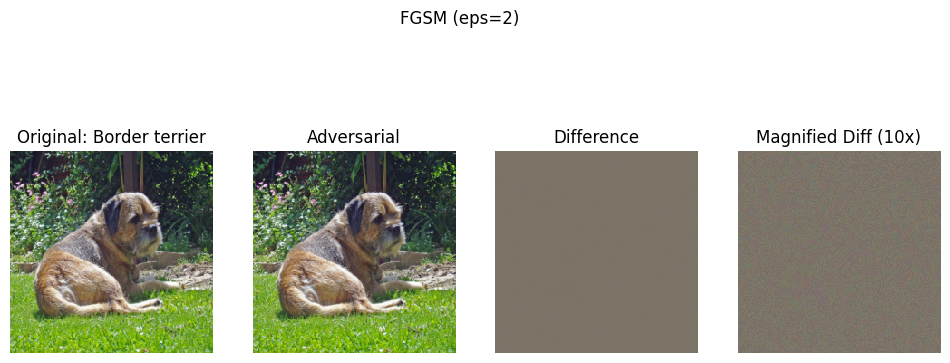


Applying Iterative with eps = 2
Probability of correct class Border terrier after: 0.0523


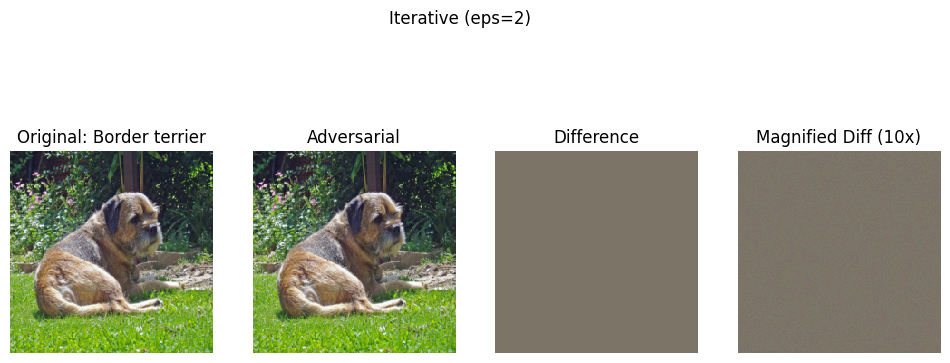


Applying FGSM with eps = 4
Probability of correct class Border terrier after: 0.0000


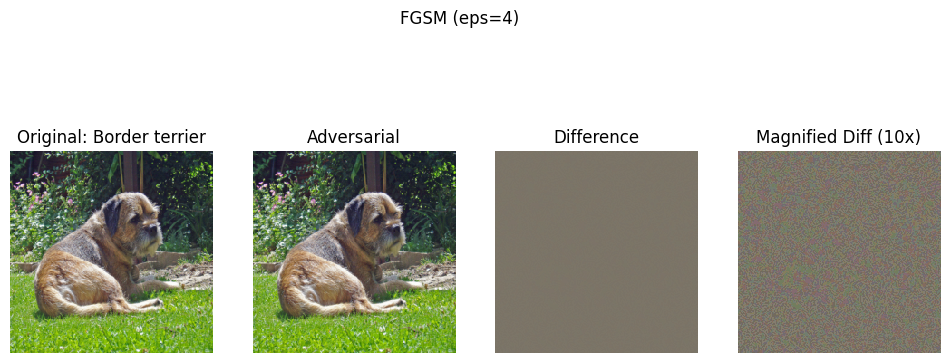


Applying Iterative with eps = 4
Probability of correct class Border terrier after: 0.0000


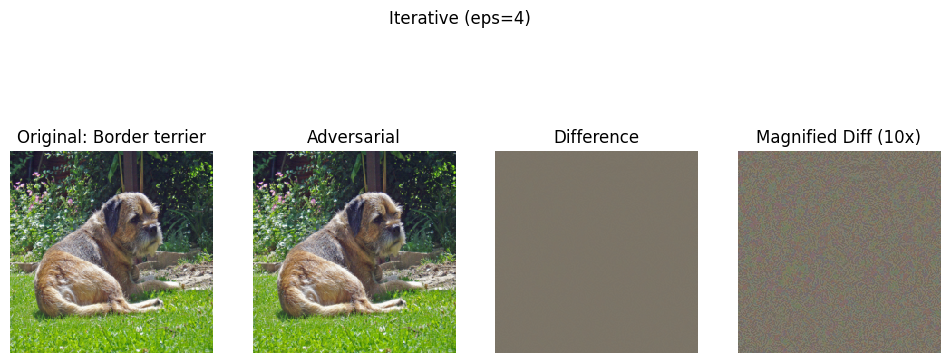


Applying FGSM with eps = 8
Probability of correct class Border terrier after: 0.0000


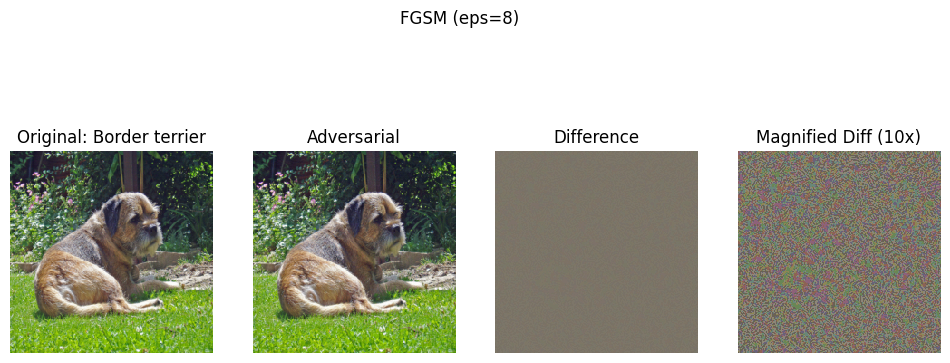


Applying Iterative with eps = 8
Probability of correct class Border terrier after: 0.0000


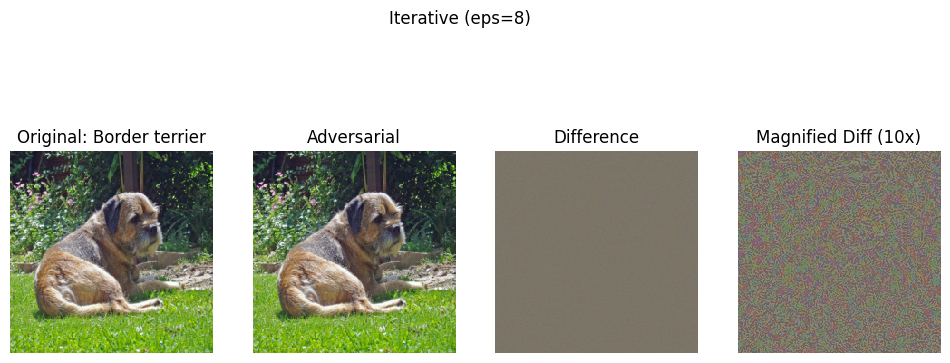


Applying FGSM with eps = 16
Probability of correct class Border terrier after: 0.0000


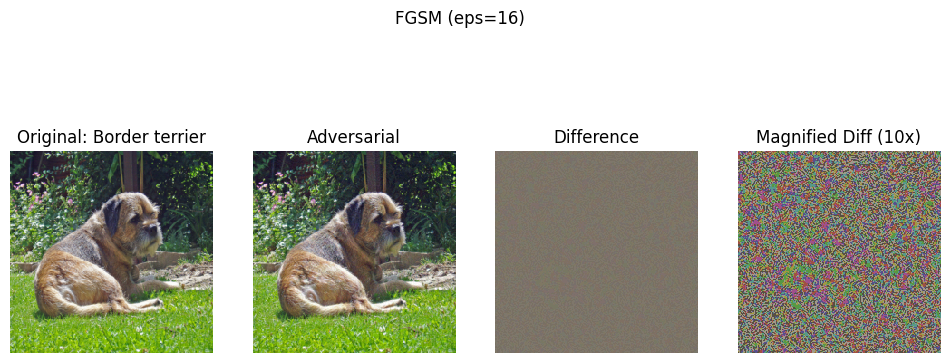


Applying Iterative with eps = 16
Probability of correct class Border terrier after: 0.0000


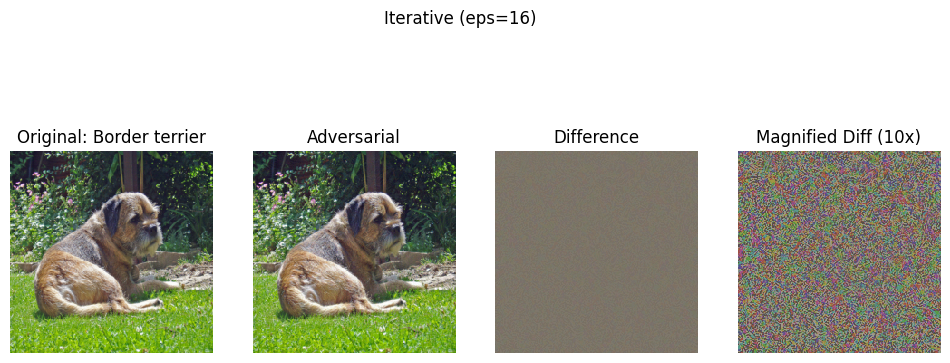

Original class: brown bear, bruin, Ursus arctos, Probability of correct class before any attack: 0.9970

Applying FGSM with eps = 2
Probability of correct class brown bear, bruin, Ursus arctos after: 0.1476


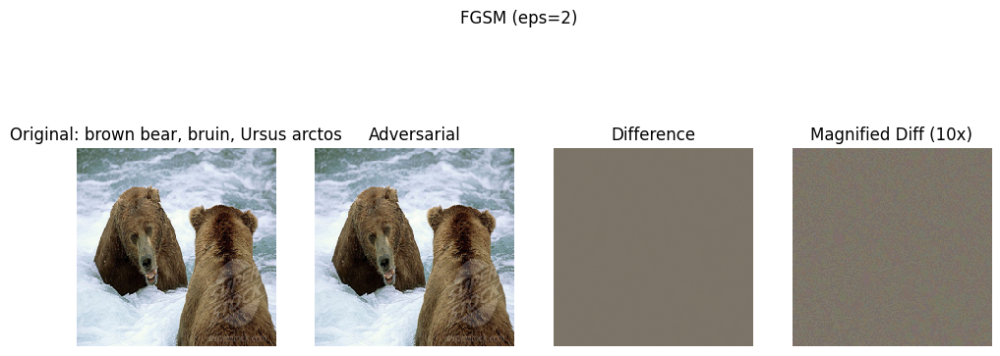


Applying Iterative with eps = 2
Probability of correct class brown bear, bruin, Ursus arctos after: 0.7315


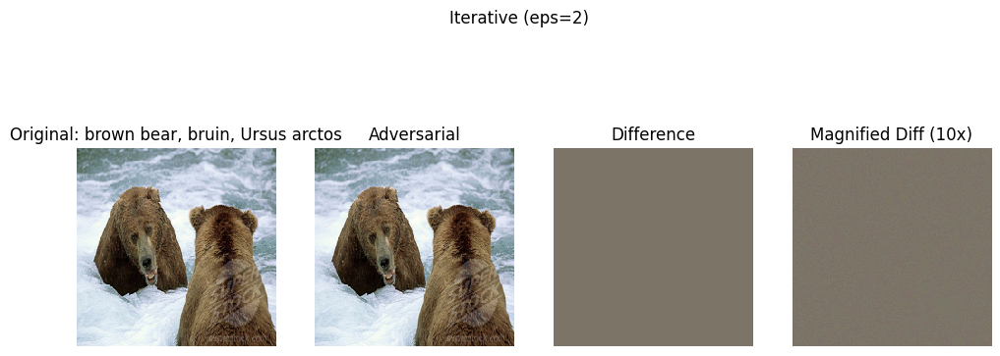


Applying FGSM with eps = 4
Probability of correct class brown bear, bruin, Ursus arctos after: 0.0061


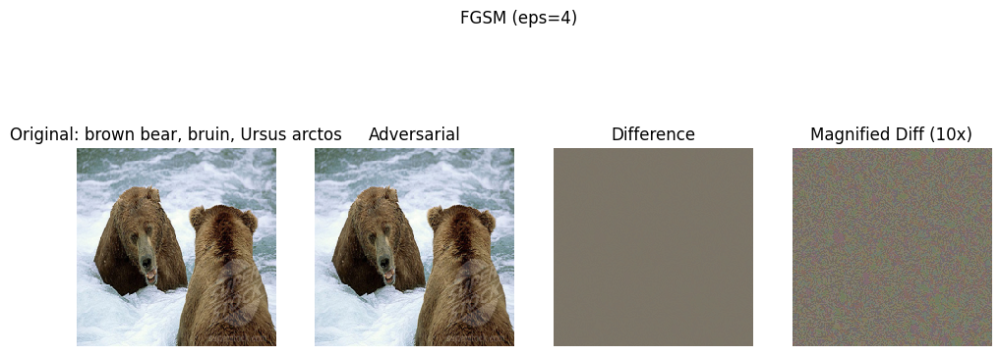


Applying Iterative with eps = 4
Probability of correct class brown bear, bruin, Ursus arctos after: 0.0000


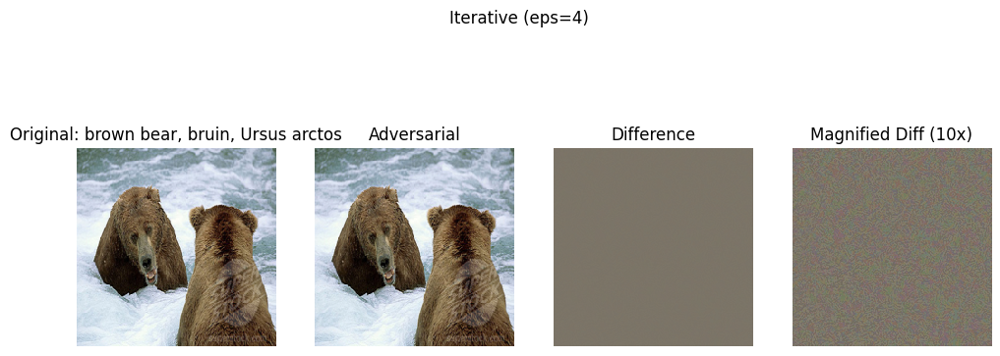


Applying FGSM with eps = 8
Probability of correct class brown bear, bruin, Ursus arctos after: 0.0006


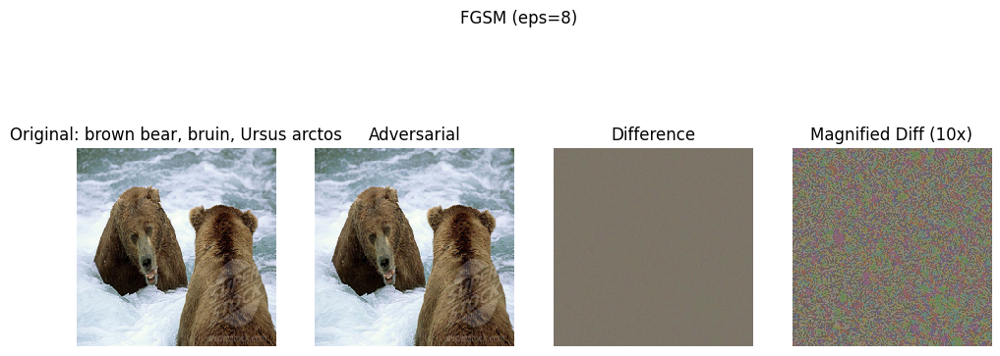


Applying Iterative with eps = 8
Probability of correct class brown bear, bruin, Ursus arctos after: 0.0000


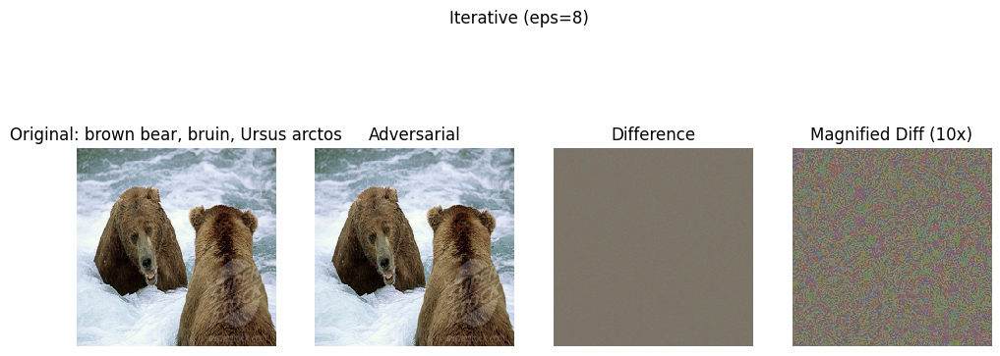


Applying FGSM with eps = 16
Probability of correct class brown bear, bruin, Ursus arctos after: 0.0001


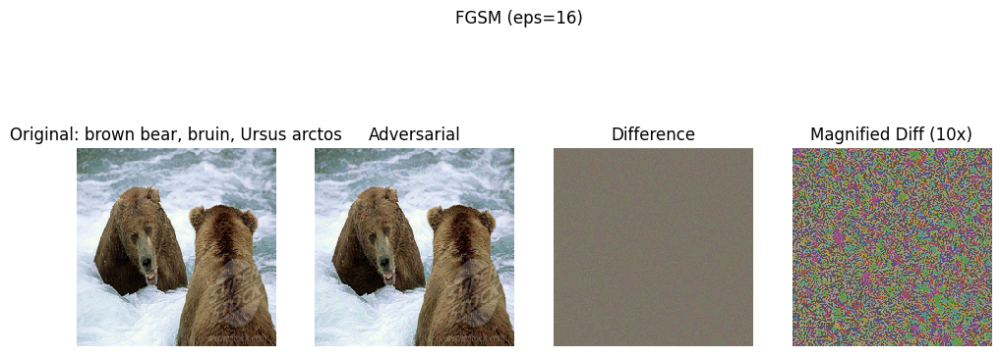


Applying Iterative with eps = 16
Probability of correct class brown bear, bruin, Ursus arctos after: 0.0000


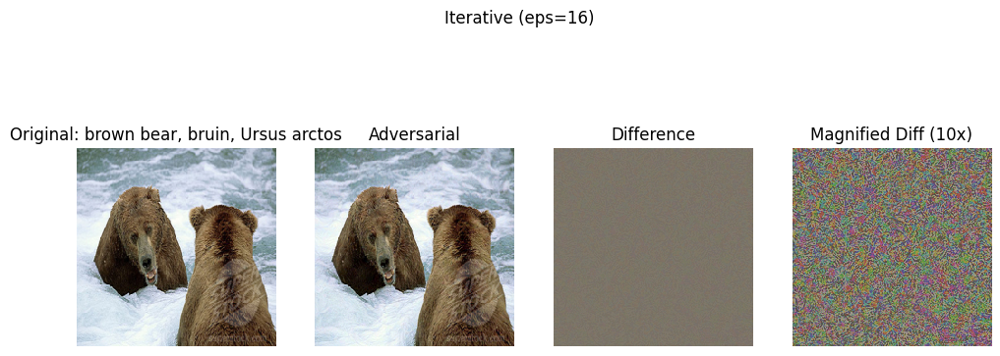

In [ ]:
run_analysis()


# Extra Credit

A popular approach for explaining model predictions is called Grad-CAMLinks to an external site. which operates similarly to the approach implemented above. The approach essentially performs a weighting of convolutional layers by gradients and then interpolates them to be a heat map. Implement Grad-CAM for ResNet18 and provide visualizations for the five images explored in Part 2. Specifically, you should generate heatmap overlays similar to Figure 1 in the paper. Also, you should explore the impact of performing Grad-CAM with respect to different layers in the network and compare Grad-CAM with the approach you implemented in Part 2. Which is better? Note you must implement Grad-CAM yourself and not use any existing implementations.


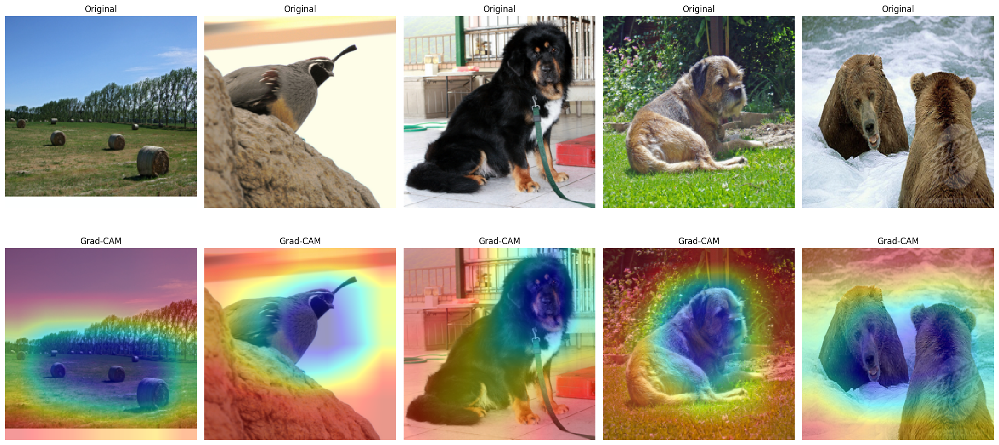

In [ ]:
import torch
import torch.nn.functional as F
import matplotlib.pyplot as plt
import numpy as np
from torchvision import transforms
from PIL import Image
import cv2

def grad_cam(model, feature_module, target_layer_names, input, target_category=None):
    model.eval()
    feature_module.eval()
    target_layer = None

    # Find the target layer
    for name, module in feature_module.named_children():
        if name in target_layer_names:
            target_layer = module
            break

    if target_layer is None:
        raise ValueError("Couldn't find target layer.")

    def forward_hook(module, input, output):
        model.feature_maps = output.detach()

    def backward_hook(module, grad_in, grad_out):
        model.gradients = grad_out[0].detach()

    # Register hooks on the target layer
    f_hook = target_layer.register_forward_hook(forward_hook)
    b_hook = target_layer.register_backward_hook(backward_hook)

    # Forward pass
    output = model(input)
    if target_category is None:
        target_category = output.argmax(dim=1)

    # Zero grads
    model.zero_grad()
    # Target for backprop
    one_hot_output = torch.zeros_like(output)
    one_hot_output.scatter_(1, target_category.unsqueeze(-1), 1.0)

    # Backward pass
    output.backward(gradient=one_hot_output)

    # Remove hooks
    f_hook.remove()
    b_hook.remove()

    # Process feature maps and gradients
    gradients = model.gradients  # Gradients of the output w.r.t. the feature maps
    feature_maps = model.feature_maps  # Feature maps

    # Global Average Pooling of gradients to get weights
    weights = torch.mean(gradients, dim=[2, 3], keepdim=True)

    # Weighted combination of feature maps
    grad_cam_maps = torch.sum(weights * feature_maps, dim=1)  # Sum of weighted feature maps

    # ReLU to only keep positive influences
    grad_cam_maps = F.relu(grad_cam_maps)

    # Create heatmaps
    heatmaps = []
    for i in range(grad_cam_maps.size(0)):
        grad_cam_map = grad_cam_maps[i].cpu().numpy()
        grad_cam_map = cv2.resize(grad_cam_map, (input.shape[3], input.shape[2]))
        grad_cam_map = np.uint8(255 * grad_cam_map / np.max(grad_cam_map))
        heatmap = cv2.applyColorMap(grad_cam_map, cv2.COLORMAP_JET)
        heatmaps.append(heatmap)

    return heatmaps

def apply_grad_cam(images, model, target_layers, preprocess):
    input_tensors = torch.cat([preprocess(Image.fromarray(img)).unsqueeze(0) for img in images], dim=0)
    input_tensors.requires_grad = True

    if torch.cuda.is_available():
        input_tensors = input_tensors.to('cuda')
        model.to('cuda')

    heatmaps = grad_cam(model, model, target_layers, input_tensors)

    plt.figure(figsize=(20, 10))
    for i, (input_tensor, heatmap) in enumerate(zip(input_tensors, heatmaps)):
        img = input_tensor.cpu().data.numpy().transpose((1, 2, 0))
        img = img * np.array([0.229, 0.224, 0.225]) + np.array([0.485, 0.456, 0.406])  # Denormalize
        img = np.clip(img, 0, 1)  # Ensure values are within [0, 1]

        # Convert heatmap to [0, 1] for display
        heatmap = np.float32(heatmap) / 255.0
        superimposed_img = cv2.addWeighted(np.float32(img), 0.6, heatmap, 0.4, 0)

        plt.subplot(2, 5, i+1)
        plt.imshow(img)
        plt.title("Original")
        plt.axis('off')

        plt.subplot(2, 5, i+6)
        plt.imshow(superimposed_img)
        plt.title("Grad-CAM")
        plt.axis('off')

    plt.tight_layout()
    plt.show()

# Assuming 'X' is your loaded set of images and 'preprocess' is your preprocessing function
apply_grad_cam(X, resnet18, ['layer4'], preprocess)


# Grad CAM vs Attention Maps

## Grad-CAM:

creates heatmaps with class discrimination and high resolution.
Clearly draws attention to the crucial areas of the picture that influence the model's conclusion.
The use of gradients in the weighted combination of feature maps makes the heatmaps more concentrated and localised, especially when it comes to particular features that are relevant to the forecast.

## Part 2 of Attention Maps:

Usually more dispersed and diffuse throughout the picture.
can draw attention to larger areas that may be more about generic image qualities than class-specific traits.
These maps indicate the model's "looking," but they do not always explain the reasoning behind the decisions the model takes.
